# EXCERCISE: DIAMONDS DATASET

Homework: use linear regression for diamonds dataset. Try to find the best model without any multicollinearity.
Kumpulkan notebook tugas kalian ke Brigita.gems@gmail.com dengan subject: Tugas Linear Regression

In [70]:
import statsmodels.api as sm 
import seaborn as sns 
from statsmodels.api import OLS
import matplotlib.pyplot as plt 
import pandas as pd 

In [71]:
df = sns.load_dataset('diamonds')
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [93]:
df.corr(method='spearman')

,carat,depth,table,price,x,y,z
carat,1.000000,0.030104,0.194980,0.962883,0.996117,0.995572,0.993183
depth,0.030104,1.000000,-0.245061,0.010020,-0.023442,-0.025425,0.103498
table,0.194980,-0.245061,1.000000,0.171784,0.202231,0.195734,0.159878
price,0.962883,0.010020,0.171784,1.000000,0.963196,0.962719,0.957232
x,0.996117,-0.023442,0.202231,0.963196,1.000000,0.997895,0.987355
y,0.995572,-0.025425,0.195734,0.962719,0.997895,1.000000,0.987068
z,0.993183,0.103498,0.159878,0.957232,0.987355,0.987068,1.000000


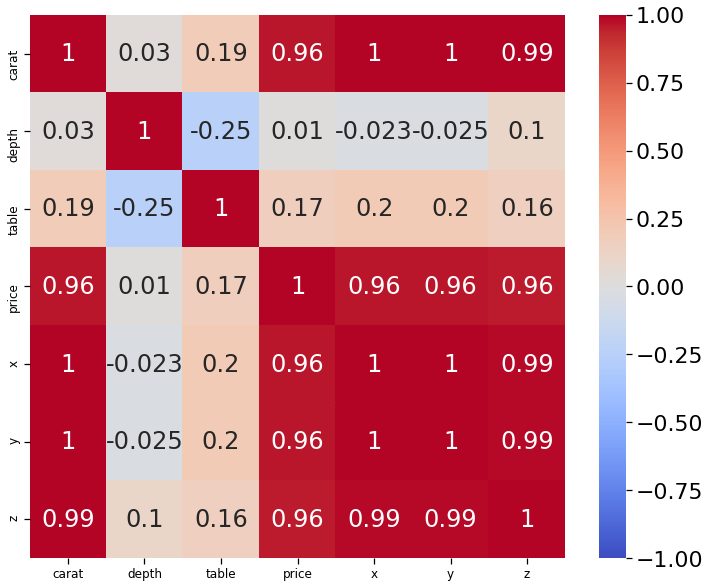

In [94]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(method='spearman'), vmin=-1, vmax=1, cmap='coolwarm', annot=True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

artinya: 

- price punya korelasi positif dan kuat dgn carat, x, y, z


PAHAMI DOMAIN KNOELEDGE !

- x,y,z adalah dimensi, jelas mempengaruhi carat (gram), jadi x,y,z bisa diabaikan
- depth dan table tidak berkorelasi dengan price, jadi bisa diabaikan juga
- sekarang, kita coba pakai feature yg categorical, caranya dgn membuat data dummy

In [74]:
# membuat data dummy 

df_dummy_diamonds = pd.get_dummies(df, drop_first=True)
df_dummy_diamonds.head()

,carat,depth,table,price,x,y,z,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,0.23,61.5,55.0,326,3.95,3.98,2.43,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,0.21,59.8,61.0,326,3.89,3.84,2.31,0,0,1,...,0,0,0,0,1,0,0,0,0,0
2,0.23,56.9,65.0,327,4.05,4.07,2.31,1,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0.29,62.4,58.0,334,4.20,4.23,2.63,0,0,1,...,0,1,0,0,0,0,0,1,0,0
4,0.31,63.3,58.0,335,4.34,4.35,2.75,1,0,0,...,0,0,1,0,0,1,0,0,0,0


In [95]:
df_dummy_diamonds.corr(method='spearman')

,carat,depth,table,price,x,y,z,cut_Good,cut_Ideal,cut_Premium,...,color_H,color_I,color_J,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
carat,1.000000,0.030104,0.194980,0.962883,0.996117,0.995572,0.993183,0.038640,-0.159341,0.108375,...,0.091267,0.134090,0.152723,-0.133275,0.089660,0.263467,-0.056014,-0.031732,-0.192250,-0.150040
depth,0.030104,1.000000,-0.245061,0.010020,-0.023442,-0.025425,0.103498,0.204445,-0.062644,-0.207521,...,0.025274,0.026129,0.027539,-0.040706,0.057481,0.014000,-0.027257,-0.004551,-0.030890,-0.026888
table,0.194980,-0.245061,1.000000,0.171784,0.202231,0.195734,0.159878,0.138392,-0.597765,0.421403,...,0.013613,0.020218,0.040765,-0.083256,0.056677,0.096546,-0.029308,-0.005101,-0.072883,-0.065849
price,0.962883,0.010020,0.171784,1.000000,0.963196,0.962719,0.957232,0.017646,-0.117449,0.094623,...,0.054007,0.073737,0.082914,-0.067239,0.035320,0.167910,-0.026240,-0.013144,-0.121999,-0.082766
x,0.996117,-0.023442,0.202231,0.963196,1.000000,0.997895,0.987355,0.027371,-0.154464,0.123488,...,0.089754,0.131681,0.150493,-0.130643,0.087004,0.263002,-0.055189,-0.031579,-0.191185,-0.148759
y,0.995572,-0.025425,0.195734,0.962719,0.997895,1.000000,0.987068,0.031185,-0.148001,0.103314,...,0.088159,0.132261,0.150777,-0.126970,0.086172,0.260512,-0.054215,-0.032938,-0.188782,-0.146265
z,0.993183,0.103498,0.159878,0.957232,0.987355,0.987068,1.000000,0.051977,-0.154645,0.083965,...,0.091652,0.135102,0.153521,-0.133208,0.092291,0.260631,-0.056589,-0.032414,-0.192232,-0.149342
cut_Good,0.038640,0.204445,0.138392,0.017646,0.027371,0.031185,0.051977,1.000000,-0.258018,-0.185385,...,-0.009517,0.006187,0.014977,-0.033046,0.055938,0.041970,-0.017116,-0.021063,-0.037564,-0.038627
cut_Ideal,-0.159341,-0.062644,-0.597765,-0.117449,-0.154464,-0.148001,-0.154645,-0.258018,1.000000,-0.478074,...,-0.021264,-0.009225,-0.038490,0.104986,-0.082865,-0.108242,0.034247,0.015669,0.088354,0.075508
cut_Premium,0.108375,-0.207521,0.421403,0.094623,0.123488,0.103314,0.083965,-0.185385,-0.478074,1.000000,...,0.027895,0.005899,0.017231,-0.054013,0.023275,0.067623,-0.011866,0.022611,-0.053852,-0.061949


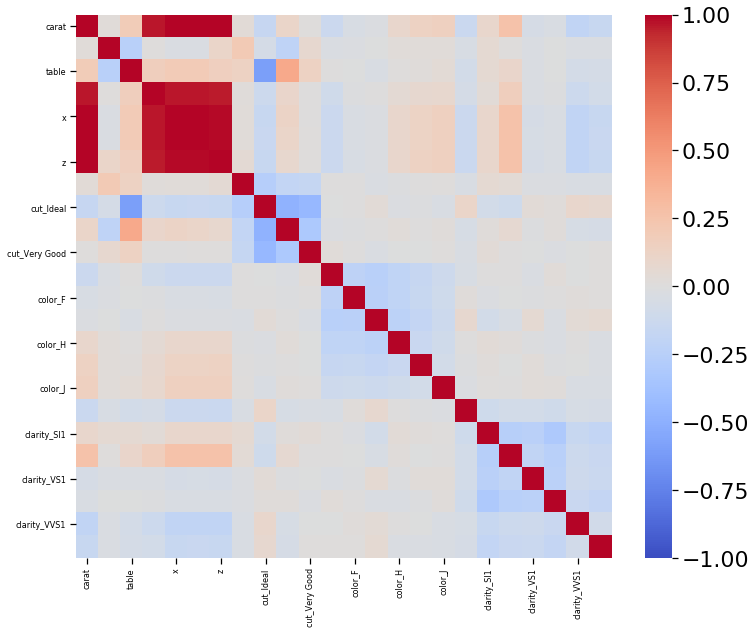

In [96]:
plt.figure(figsize=(12,10))
sns.heatmap(df_dummy_diamonds.corr(method='spearman'), vmin=-1, vmax=1, cmap='coolwarm', annot=False)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

In [76]:
# membuat variable dependent (Y) dan independent (X)

Y = df_dummy_diamonds['price']
X = df_dummy_diamonds.drop(columns='price')

In [77]:
# fitting data

sm_lm = OLS(Y, sm.add_constant(X))
result = sm_lm.fit()

print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.920
Method:                 Least Squares   F-statistic:                 2.688e+04
Date:                Thu, 07 Jan 2021   Prob (F-statistic):               0.00
Time:                        14:09:39   Log-Likelihood:            -4.5573e+05
No. Observations:               53940   AIC:                         9.115e+05
Df Residuals:                   53916   BIC:                         9.117e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          2184.4774    408.197      5.352

interpretasi:

- Prob (F-Stat): 0.00 (<0.05 artinya ada cukup bukti bahwa salah satu atau semua di antara feture X mempengaruhi nilai price)

- P>|t|: <0.05 artinya ada cukup bukti bahwa semua feature X meningkatkan nilai price. (untuk melihat apakah coef nya signifikan atau tidak)

- Adj.R-squared: 0.920 , model yg kita buat bisa menjelaskan 92,0% dari semua variance price

## Diagnostic & Collinearity

### Normality Assumption

Text(0.5, 0, 'Residual')

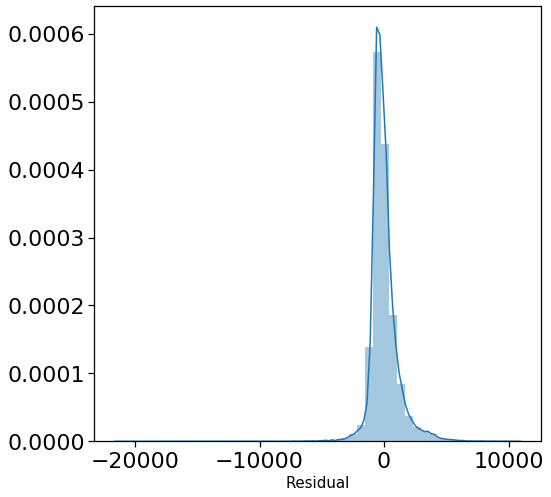

In [78]:
plt.figure(figsize=(8,8))
sns.set_context('notebook', font_scale=2)
sns.distplot(result.resid)
plt.xlabel('Residual', fontsize=15)

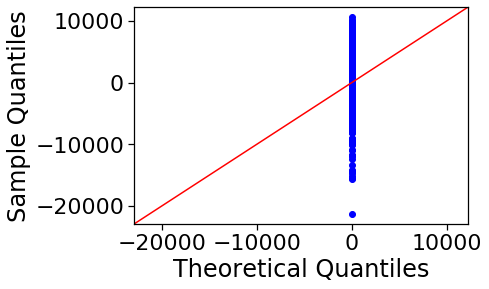

In [79]:
sm.qqplot(result.resid, line='45')
plt.show()

# distribusi tidak normal, seharusnya titik2 biru berjajar mendekati garis merah

Normality Assumption tidak terpenuhi

### Gauss MArkov Assumption

Text(0, 0.5, 'Residual')

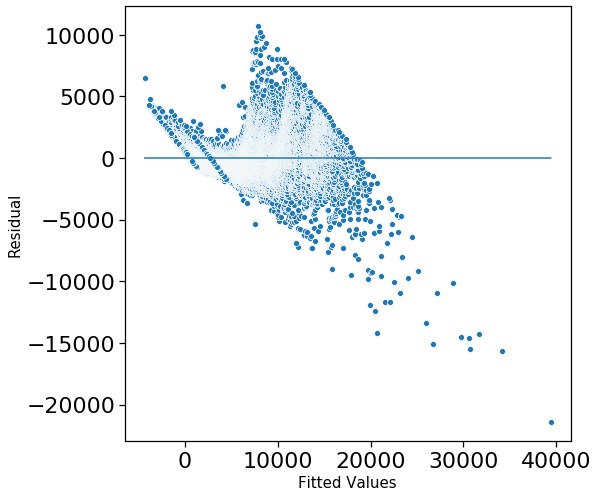

In [80]:
plt.figure(figsize=(8,8))
sns.set_context('notebook', font_scale=2)
sns.scatterplot(result.fittedvalues,result.resid)
sns.lineplot(result.fittedvalues,0)
plt.xlabel('Fitted Values', fontsize=15)
plt.ylabel('Residual', fontsize=15)

Kita bisa lihat dari diagram di atas:

- garisnya adalah Y, titik2nya adalah residual.
- yg kita mau kalau Gauss Markov adalah titiknya acak tapi merata dekat dengan garisnya (equal variance)
- tapi gambar di atas tidak menunjukkan equal variance

berarti Gaus Markov Assumption tidak terpenuhi

### Multi collinearity

kita akan mengeliminasi feature mana saja yang menyebabkan multicollinearity (nilai VIF > 4)

In [81]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [82]:
def calc_vif(X):

    # calculating vif
    vif = pd.DataFrame()
    vif['variables'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values,i) for i in range (X.shape[1])]

    return(vif)

In [87]:
calc_vif(df_dummy_diamonds.drop(columns=['price']))

,variables,VIF
0,carat,76.512677
1,depth,646.980861
2,table,641.680011
3,x,1366.837897
4,y,536.992970
5,z,564.591584
6,cut_Good,4.119430
7,cut_Ideal,15.137009
8,cut_Premium,9.938922
9,cut_Very Good,8.739739


In [88]:
# Percobaan 1
# coba eliminasi yg nilai VIF nya ratusan

calc_vif(df_dummy_diamonds.drop(columns=['price','depth','table','x','y','z']))

# nilai VIF mayoritas < 10, dan berdasarkan domain knowledge, cut,color,dan clarity memang tidak berhubungan dengan carat, jadi kita bisa ambil semua feature ini, (ini R-square nya lebih tinggi, untuk prediksi lebih baik yg RR-square nya lebih tinggi) 

# kalau mau coba sampai VIFmya <4, kita coba eliminasi antara features 'cut' atau 'clarity'

,variables,VIF
0,carat,4.665188
1,cut_Good,3.522404
2,cut_Ideal,12.428895
3,cut_Premium,8.200831
4,cut_Very Good,7.381726
5,color_E,2.343241
6,color_F,2.332493
7,color_G,2.657563
8,color_H,2.224078
9,color_I,1.859942


In [90]:
# Percobaan 2
# coba eliminasi features 'cut'

calc_vif(df_dummy_diamonds.drop(columns=['price','depth','table','x','y','z','cut_Good','cut_Ideal','cut_Premium','cut_Very Good']))

,variables,VIF
0,carat,4.587482
1,color_E,2.316755
2,color_F,2.313482
3,color_G,2.634909
4,color_H,2.209159
5,color_I,1.851600
6,color_J,1.478565
7,clarity_IF,1.268043
8,clarity_SI1,2.856707
9,clarity_SI2,2.620383


In [91]:
# Percobaan 3
# coba eliminasi features 'clarity'

calc_vif(df_dummy_diamonds.drop(columns=['price','depth','table','x','y','z','clarity_IF','clarity_SI1','clarity_SI2','clarity_VS1','clarity_VS2','clarity_VVS1','clarity_VVS2']))

# ternyata nilai VIF nya lebih bagus yg ini (lebih kecil)

,variables,VIF
0,carat,3.984060
1,cut_Good,1.640004
2,cut_Ideal,3.578824
3,cut_Premium,2.904397
4,cut_Very Good,2.557259
5,color_E,2.192253
6,color_F,2.167082
7,color_G,2.414384
8,color_H,2.093344
9,color_I,1.770285


Pertimbangan:

- Pada percobaan 3, nilai VIF nya lebih kecil (feature yang akan digunakan adalah carat, cut, dan color)
- Jika mempertimbangkan nilai coeff nya, maka feature 'clarity' nilai coeffnya lebih besar dari 'cut'

Jadi kita akan menggunakan features: carat, color, dan clarity 